# Fetching Cropped GOES East Training Samples

Now we have all of the pieces to use the IBTrACS data to crop a GOES East image around the tropical cyclone. To overcome the issue of nighttime images, we'll use band 7 of the ABI. This band is the shortwave IR band, with central wavelength at 3.9 microns.

Downloading all of these GOES images will take some time, but I think it would be best to have an equal proportion of positive and negative samples in the training set. Fortunately, tropical cyclones aren't outrageously large, so we can use different parts of the same GOES image for positive and negative samples. This does have the problem though of biasing our sample images from the typical hurricane season, and this may need to be addressed later.

## Import Modules

We start by importing any of the needed modules. Let's also avoid plotting each image.

In [14]:
# Import modules
import datetime
import numpy as np
from pyproj import Proj
from PIL import Image
import time
import os
from pathlib import Path
import xarray as xr
import random

# Import functions I've written
os.chdir("../scripts")
import goes
import ibtracs

## Load Valid IBTrACS Data

We've already gone through and removed any IBTrACS data that wasn't valid for our training purposes. Let's also filter out the storm's *nature*. The nature of the storm has a few options: 
* TS - storm is tropical 
* SS - Subtropical 
* ET - Extratropical 
* DS - Disturbance 
* MX - Mix of conflicting reports 
* NR - Not Reported 
* MM - Missing

For now, let's just focus on the tropical storms. Lastly, create a column that we'll set to `True` as we save off the images. Also, let's only look at the year 2017 for now.

In [7]:
df = ibtracs.read_data('../data/ibtracs/ibtracs_goes_east.csv')#,subset_season=True,year_start=2017,year_end=2017)
df = df.loc[df['NATURE']=='TS'].reset_index()

I don't want to run this notebook for an entire year's worth of data, as that will probably take a while. Let's subset the data even further.

In [8]:
df = df.loc[(df['ISO_TIME'] > datetime.datetime(2017,8,25)) & (df['ISO_TIME'] < datetime.datetime(2017,8,26))].copy(deep=True)
df

,index,SID,SEASON,NUMBER,NAME,ISO_TIME,NATURE,LAT,LON,WMO_WIND,WMO_PRES,TRACK_TYPE,DIST2LAND,LANDFALL,IFLAG,STORM_SPEED,STORM_DIR
670,938,2017228N14314,2017,60,HARVEY,2017-08-25 03:00:00,TS,25.3,-94.8,,,main,243,204,P______________,9,315
671,939,2017228N14314,2017,60,HARVEY,2017-08-25 06:00:00,TS,25.6,-95.1,90,966,main,204,170,O______________,9,315
672,940,2017228N14314,2017,60,HARVEY,2017-08-25 09:00:00,TS,25.9,-95.5,,,main,160,133,P______________,9,320
673,941,2017228N14314,2017,60,HARVEY,2017-08-25 12:00:00,TS,26.3,-95.8,95,949,main,133,123,O______________,9,325
674,942,2017228N14314,2017,60,HARVEY,2017-08-25 15:00:00,TS,26.7,-96.1,,,main,126,108,P______________,9,330
675,943,2017228N14314,2017,60,HARVEY,2017-08-25 18:00:00,TS,27.1,-96.3,105,943,main,108,67,O______________,9,330
676,944,2017228N14314,2017,60,HARVEY,2017-08-25 21:00:00,TS,27.5,-96.6,,,main,67,34,P______________,8,330


## Crop Training Examples

Now let's loop through the dataframe observations and save off cropped examples as positive or negative training samples. First, we get all of the unique times in the data frame, and for each unique time, we find all of the IBTrACS observations that match that time. Then, we grab the image associated with that time and crop out all of the IBTrACS observations by some set buffer size about the central IBTrACS location. We then identify the pixels we saved off so that we can keep track of what pixels are free to take negative samples from in the future. Once we've done all of the positive training samples from the IBTrACS unique time for an image, we then randomly select a pixel location, test if that proposed cropped image overlaps with previously taken images, and then save the image if it doesn't overlap with other samples.

In [5]:
# Get the starting time
tic = time.perf_counter()

# Set the buffer (in pixels) size
sample_size = 1200
buffer_size = sample_size // 2

# Loop through all of the dates in the IBTrACS dataframe
for date in df['ISO_TIME'].unique():

    # Convert the numpy.datetime64 object into a datetime object
    dt = datetime.datetime.fromisoformat(str(date)[:-3])
        
    try:

        # Get the GOES data
        ds = goes.get_goes_file(position='goes-east', date=dt, band=13, product='ABI-L1b-RadF')

        # Get dataset projection data
        sat_height = ds.goes_imager_projection.perspective_point_height
        sat_lon = ds.goes_imager_projection.longitude_of_projection_origin
        sat_sweep = ds.goes_imager_projection.sweep_angle_axis

        # The projection x and y coordinates equals the scanning angle (in radians) multiplied by the satellite height
        x = ds.variables['x'][:] * sat_height
        y = ds.variables['y'][:] * sat_height

        # Create an array of ones for the negative training samples
        nx, ny = ds.Rad.shape
        free = np.ones((ny,nx))

        # Create a pyproj geostationary map object
        p = Proj(proj='geos', h=sat_height, lon_0=sat_lon, sweep=sat_sweep)

        # Get the subset of the dataframe that matches this date
        df_subset = df.loc[df['ISO_TIME'] == date]

        # Loop through all of the subset dataframe rows:
        for i, row in df_subset.iterrows():

            # Get the latitudes/longitudes of the track data
            track_lat = float(row['LAT'])
            track_lon = float(row['LON'])

            # Convert lon/lat to x/y
            track_x,track_y = p(track_lon,track_lat)

            # Get the closest point to the IBTrACS data
            x_ind = np.nanargmin(abs(x-track_x))
            y_ind = np.nanargmin(abs(y-track_y))

            # Set the file name
            file_name = dt.strftime("%Y%m%d_%HZ")+f'_x{x_ind:05.0f}_y{y_ind:05.0f}_hw{sample_size}.nc'
            file_path = os.path.join('../data/training/positive/',file_name)

            # Save as netCDF
            data = ds.Rad[y_ind-buffer_size:y_ind+buffer_size,x_ind-buffer_size:x_ind+buffer_size]
            data.to_netcdf(file_path, encoding={'y': {'dtype': 'float32'}, 'x': {'dtype': 'float32'}})

            # Mark these pixels as containing a positive sample
            free[y_ind-buffer_size:y_ind+buffer_size,x_ind-buffer_size:x_ind+buffer_size] = 0

        # Now go find some random negative samples that don't overlap with locations where free == 0
        negative_count = 0
        max_attempt_count = 5*len(df_subset)
        attempt_count = 0
        while negative_count < len(df_subset):

            # Get a random location on the image
            x_ind = np.random.randint(buffer_size,nx-buffer_size,size=1)[0]
            y_ind = np.random.randint(buffer_size,ny-buffer_size,size=1)[0]

            # Check that it doesn't overlap with previous images
            if (free[y_ind-buffer_size:y_ind+buffer_size,x_ind-buffer_size:x_ind+buffer_size] == 1).all():

                # Set the file name
                file_name = dt.strftime("%Y%m%d_%HZ")+f'_x{x_ind:05.0f}_y{y_ind:05.0f}_hw{sample_size}.nc'
                file_path = os.path.join('../data/training/negative/',file_name)

                # Save as netCDF
                data = ds.Rad[y_ind-buffer_size:y_ind+buffer_size,x_ind-buffer_size:x_ind+buffer_size]
                if data.
                data.to_netcdf(file_path, encoding={'y': {'dtype': 'float32'}, 'x': {'dtype': 'float32'}})

                # Also mark these pixels, since we have a sample already taken from them
                free[y_ind-buffer_size:y_ind+buffer_size,x_ind-buffer_size:x_ind+buffer_size] = 0

                # Advance the count of negative training sample images obtained
                negative_count = negative_count + 1

            # Advance the count of attempts and break if it has been going for too long
            attempt_count = attempt_count + 1
            if attempt_count > max_attempt_count:
                print('Breaking')
                break

        # Delete the dataset to save memory
        del(ds)

    except Exception as e:
        print(f'Error processing training data from {dt}: {e}')
        
# Get the ending time
toc = time.perf_counter()

Using goes16 for goes-east on 2017-08-25
Found file: OR_ABI-L1b-RadF-M3C13_G16_s20172370300364_e20172370311142_c20172370311193.nc
Using goes16 for goes-east on 2017-08-25
Found file: OR_ABI-L1b-RadF-M3C13_G16_s20172370600366_e20172370611144_c20172370611200.nc
Using goes16 for goes-east on 2017-08-25
Found file: OR_ABI-L1b-RadF-M3C13_G16_s20172370900366_e20172370911144_c20172370911194.nc
Using goes16 for goes-east on 2017-08-25
Found file: OR_ABI-L1b-RadF-M3C13_G16_s20172371200366_e20172371211144_c20172371211197.nc
Using goes16 for goes-east on 2017-08-25
Found file: OR_ABI-L1b-RadF-M3C13_G16_s20172371500366_e20172371511144_c20172371511193.nc
Using goes16 for goes-east on 2017-08-25
Found file: OR_ABI-L1b-RadF-M3C13_G16_s20172371800364_e20172371811142_c20172371811195.nc
Using goes16 for goes-east on 2017-08-25
Found file: OR_ABI-L1b-RadF-M3C13_G16_s20172372100364_e20172372111141_c20172372111195.nc


In [17]:
def create_netcdf_mosaic(netcdf_dir, mosaic_width=4, mosaic_height=4, padding=2, invert=True):
    """Create a mosaic of netCDF images.
    
    Args:
        netcdf_dir (str): directory containing netCDF files
        mosaic_width (int): number of images horizontally
        mosaic_height (int): number of images vertically
        padding (int): pixels of padding between images
        invert (bool): flag to invert the color scale

    Returns:
        PIL.Image: mosaic of netCDF images
    """

    netcdf_dir = Path(netcdf_dir)
    files = sorted(netcdf_dir.glob("*.nc"))
    random.shuffle(files)
    
    # Limit to the number of tiles in the mosaic
    max_files = mosaic_width * mosaic_height
    files= files[:max_files]
    
    if not files:
        print("No netCDF files found!")
        return None
    
    # Read first file to get dimensions
    first_data = xr.open_dataset(files[0])
    tile_height, tile_width = first_data.Rad.shape
    first_data.close()
    
    # Calculate mosaic dimensions
    mosaic_img_width = mosaic_width * tile_width + (mosaic_width + 1) * padding
    mosaic_img_height = mosaic_height * tile_height + (mosaic_height + 1) * padding
    
    # Create empty mosaic array (white background)
    mosaic = np.ones((mosaic_img_height, mosaic_img_width), dtype=np.uint8) * 0
    
    # Fill mosaic with images
    for idx, file_path in enumerate(files):
        row = idx // mosaic_width
        col = idx % mosaic_width
        
        # Read and normalize data
        data = xr.open_dataset(file_path)
        rad_data = data.Rad.values
        rad_data = np.where(np.isnan(rad_data),0.0,rad_data)
        data.close()
        
        # Normalize to 0-255
        rad_normalized = (rad_data - rad_data.min()) / (rad_data.max() - rad_data.min())
        rad_uint8 = (rad_normalized * 255).astype(np.uint8)
    
        if invert:
            rad_uint8 = 255 - rad_uint8
        
        # Calculate position in mosaic
        y_start = padding + row * (tile_height + padding)
        x_start = padding + col * (tile_width + padding)
        
        # Place tile in mosaic
        mosaic[y_start:y_start + tile_height, x_start:x_start + tile_width] = rad_uint8
    
    # Convert to PIL Image
    mosaic_img = Image.fromarray(mosaic)
        
    return mosaic_img

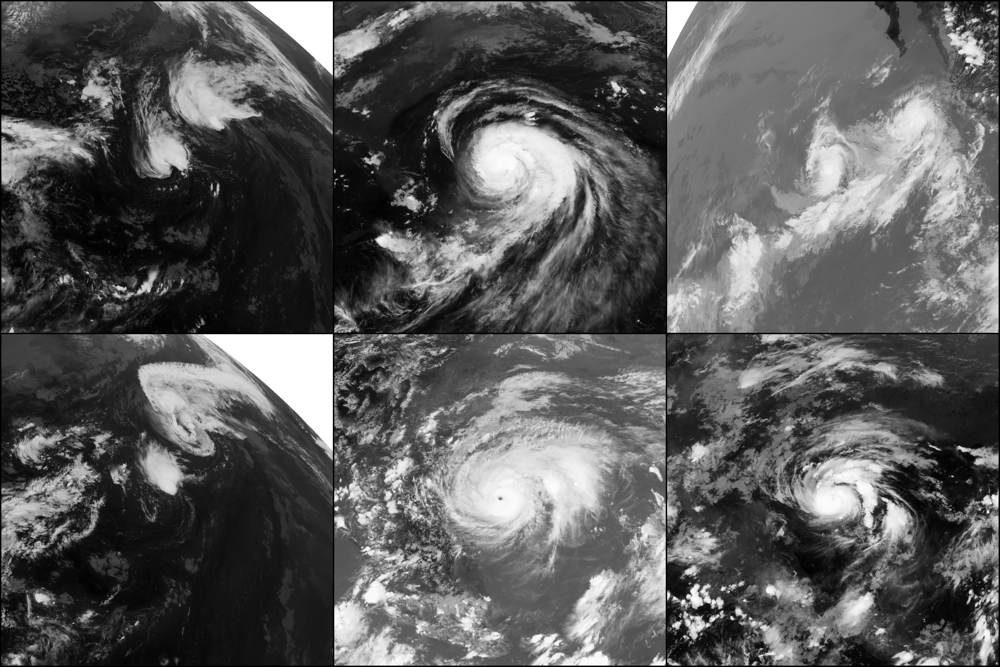

In [18]:
netcdf_dir = "../data/training/positive/"
mosaic_img = create_netcdf_mosaic(netcdf_dir, mosaic_width=3, mosaic_height=2, padding=5, invert=True)
display(mosaic_img)

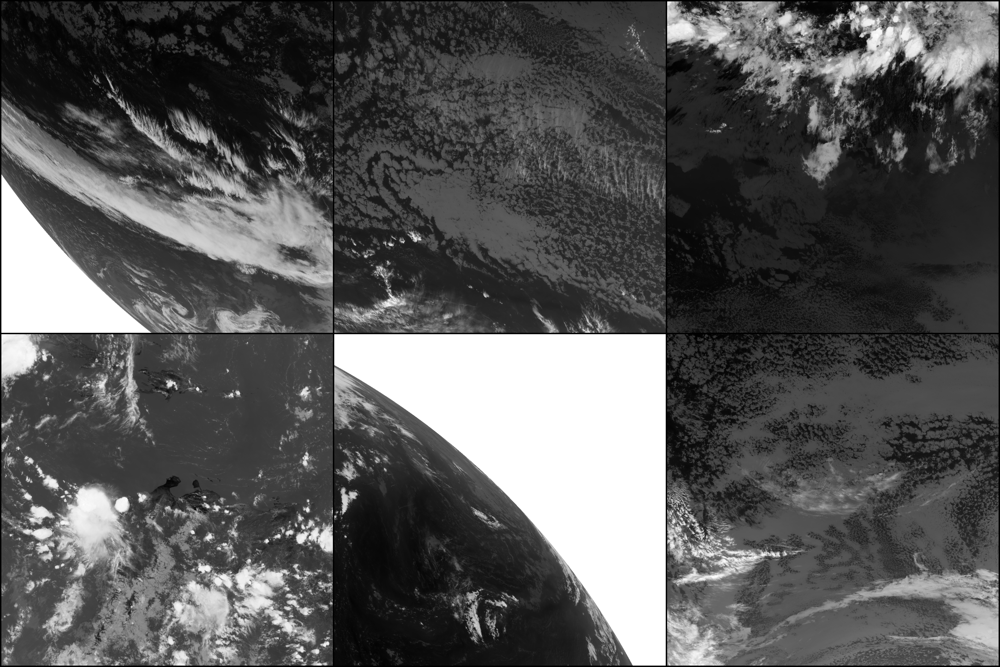

In [19]:
netcdf_dir = "../data/training/negative/"
mosaic_img = create_netcdf_mosaic(netcdf_dir, mosaic_width=3, mosaic_height=2, padding=5, invert=True)
display(mosaic_img)